In [1]:
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import time

In [2]:
img = Image.open('./res/dog_example.jpg')

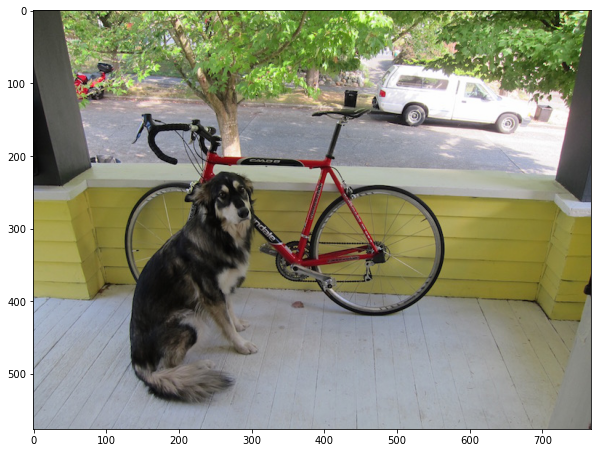

In [3]:
plt.figure(figsize=(10, 10))
plt.imshow(img)

In [29]:
def intersection_over_union(predicted_box, gt_box):
    # Box: (x1, y1, x2, y2)
    
    # Find intersection box coordinate
    x1 = max(predicted_box[0], gt_box[0])
    y1 = max(predicted_box[1], gt_box[1])
    x2 = min(predicted_box[2], gt_box[2])
    y2 = min(predicted_box[3], gt_box[3])
    
    inter_area = max(0, x2 - x1) * max(0, y2 - y1)
    predicted_box_area = abs((predicted_box[2] - predicted_box[0]) *
                            (predicted_box[3] - predicted_box[1]))
    gt_box_area = abs((gt_box[2] - gt_box[0]) * (gt_box[3] - gt_box[1]))
    
    iou = inter_area / (predicted_box_area + gt_box_area - inter_area)
    
    return x1, y1, x2, y2, iou

def draw_iou_box(img, iou_box):
    img = cv2.rectangle(img, iou_box[0:2], iou_box[2:4], 
                       (0, 0, 255), 2)
    
    img = cv2.putText(img, 'IOU: {:.2f}%'.format(iou_box[-1] * 100),
                     (550, 550), cv2.FONT_HERSHEY_SIMPLEX,
                     1, (0, 0, 255), 2)
    
    return img
    
def generate_predicted_box(gt_box):
    x1 = int(np.random.rand() * gt_box[0] + 10)
    y1 = int(np.random.rand() * gt_box[1] + 10)
    x2 = x1 + int(np.random.rand() * (gt_box[2] - gt_box[0] + 10))
    y2 = y1 + int(np.random.rand() * (gt_box[3] - gt_box[1] + 10))
    
    return x1, y1, x2, y2

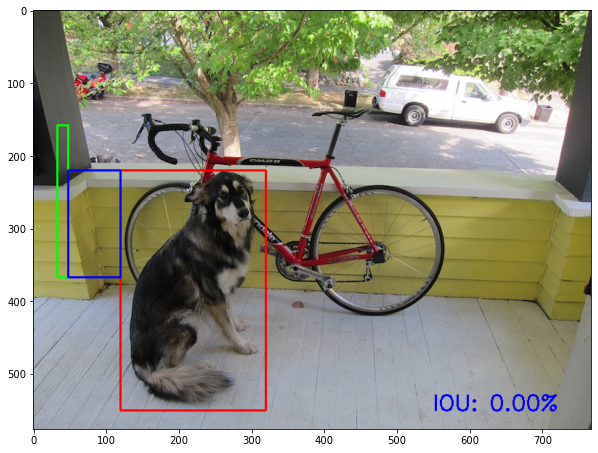

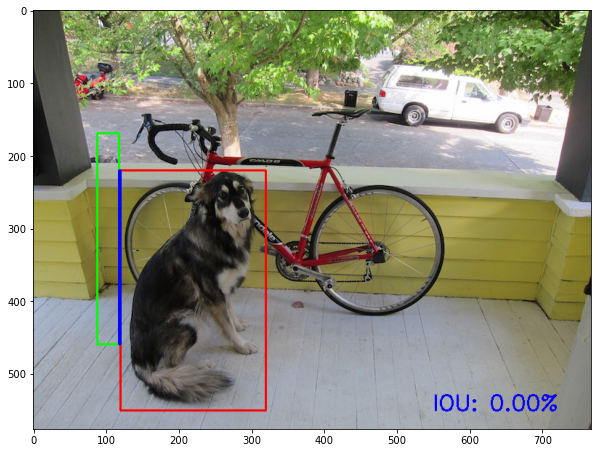

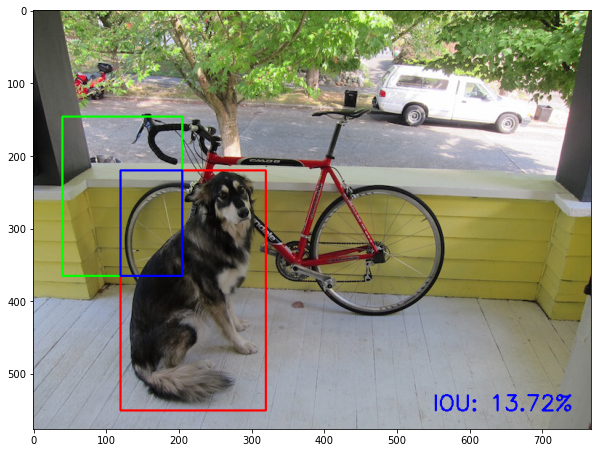

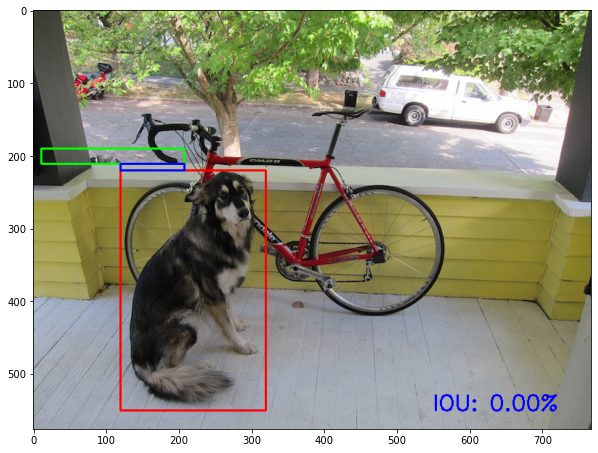

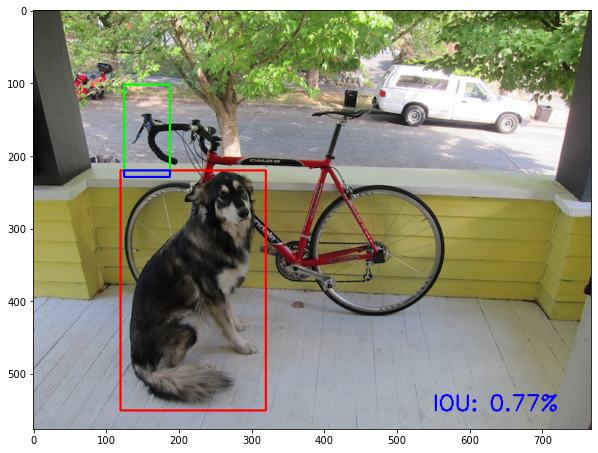

...

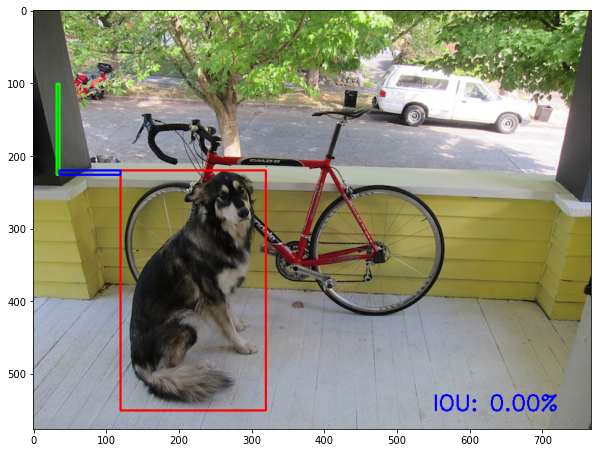

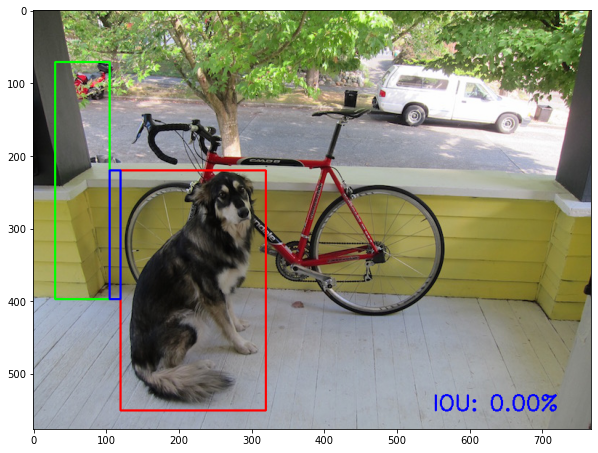

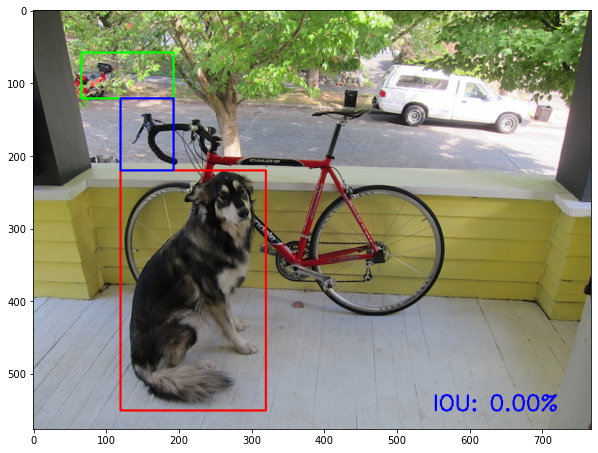

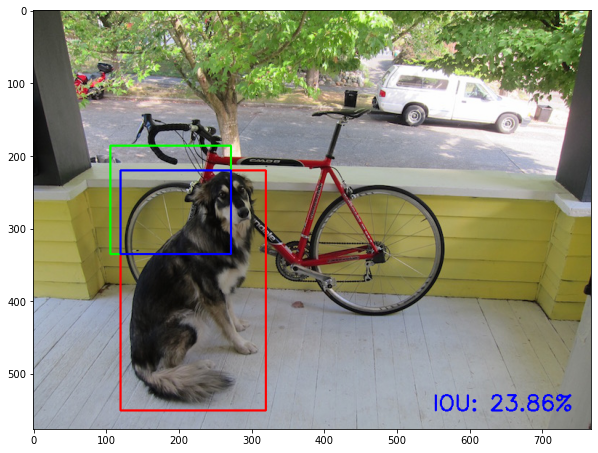

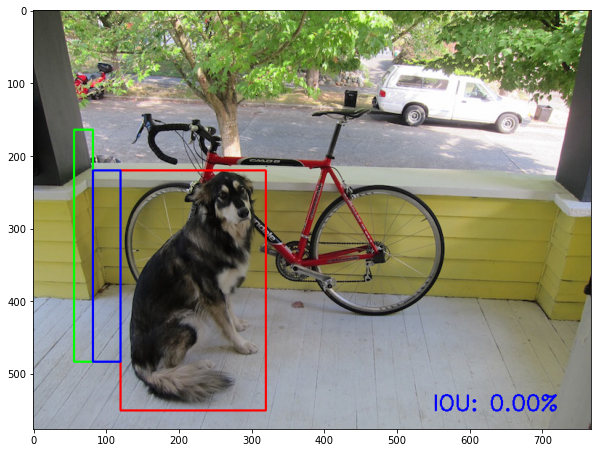

In [30]:
for _ in range(20):
    
    img = Image.open('./res/dog_example.jpg')
    
    gt_box = (120, 220, 320, 550)
    predicted_box = generate_predicted_box(gt_box)
    rs = intersection_over_union(predicted_box, gt_box)
    
    img_rec = cv2.rectangle(np.asarray(img), gt_box[:2], gt_box[2:], (255, 0, 0), 2)
    img_rec = cv2.rectangle(img_rec, predicted_box[:2], predicted_box[2:], (0, 255, 0), 2)
    
    img = draw_iou_box(img_rec, rs)
    
    plt.figure(figsize=(10, 10))
    plt.imshow(img) 


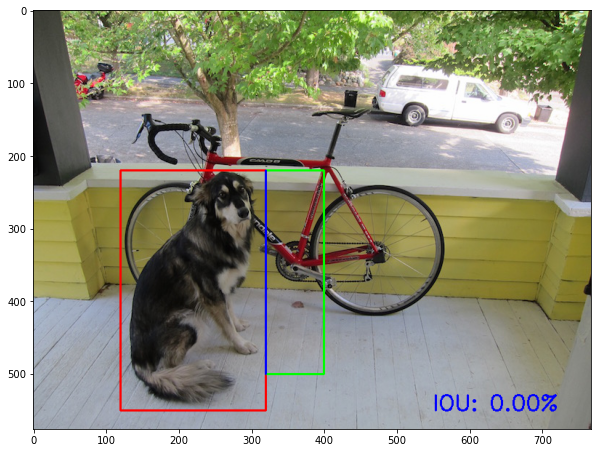

In [31]:
img = Image.open('./res/dog_example.jpg')
gt_box = (120, 220, 320, 550)
predicted_box = (320, 220, 400, 500)
img_rec = cv2.rectangle(np.asarray(img), gt_box[:2], gt_box[2:], (255, 0, 0), 2)
img_rec = cv2.rectangle(img_rec, predicted_box[:2], predicted_box[2:], (0, 255, 0), 2)
rs = intersection_over_union(predicted_box, gt_box)
img = draw_iou_box(img_rec, rs) 
plt.figure(figsize=(10, 10))
plt.imshow(img) 

In [ ]:
def ioux